## ROF

#### Préparation de données

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch

region = input('Enter the region: ')
Region = region
if Region == '17':
    Region = 'Europe'
elif Region == '46':
    Region = 'Arctic'

In [2]:
file_names = [f'hist-GHG_{region}.csv', f'hist-aer_{region}.csv', f'hist-nat_{region}.csv', f'historical_{region}.csv'] 
output_names = ['ghg', 'aer', 'nat', 'hist']

for file_name, output_name in zip(file_names, output_names):
    data_hist_df = pd.read_csv(file_name)
    last_115_years = data_hist_df.iloc[:, -117:-2]
    last_115_years['modele'] = data_hist_df['modele']
    grouped_data = last_115_years.groupby('modele')

    for model, group in grouped_data:
        numeric_columns = group.columns[:-1]
        instance = group[numeric_columns].mean()
        instance = instance.to_numpy()
        np.save(f'figures/{Region}/{output_name}_{model}.npy', instance)
        

In [3]:
file_names = [f'hist-GHG_{region}.csv', f'hist-aer_{region}.csv', f'hist-nat_{region}.csv', f'historical_{region}.csv'] 
output_names = ['ghg', 'aer', 'nat', 'hist']

for file_name, output_name in zip(file_names, output_names):
    data_hist_df = pd.read_csv(file_name)
    last_115_years = data_hist_df.iloc[:, -117:-2]
    last_115_years['modele'] = data_hist_df['modele']
    grouped_data = last_115_years.groupby('modele')

    for model, group in grouped_data:
        numeric_columns = group.columns[:-1]
        instance = group[numeric_columns]
        np.save(f'figures/{Region}/{output_name}_{model}_no_mean.npy', instance)

In [4]:
path = f'historical_{region}.csv'
data_hist_df = pd.read_csv(path)

unique_models = data_hist_df['modele'].unique()
for model in unique_models:
    model_data = data_hist_df[data_hist_df['modele'] == model]
    last_115_years = model_data.iloc[:, -117:]
    random_profile = last_115_years.sample(n=1, random_state=0)
    numeric_columns = random_profile.columns[2:]
    profile_values = random_profile[numeric_columns].values.flatten()
    torch.save(torch.from_numpy(profile_values), f'figures/{Region}/rand_hist_{model}.pt')

In [5]:
path = f'hist-aer_{region}.csv'
data_aer_df = pd.read_csv(path)

tenseurs_list = []

for modele, groupe in data_aer_df.groupby('modele'):
    annees = groupe.iloc[:, 50:165].values
    annees = np.transpose(annees)
    tenseur = torch.tensor(annees, dtype=torch.float64)
    tenseurs_list.append(tenseur)

for tenseur in tenseurs_list:
    print(tenseur.shape)

torch.save(tenseurs_list, f'figures/{Region}/aer.pt')

torch.Size([115, 3])
torch.Size([115, 3])
torch.Size([115, 2])
torch.Size([115, 8])
torch.Size([115, 30])
torch.Size([115, 3])
torch.Size([115, 10])
torch.Size([115, 4])
torch.Size([115, 8])
torch.Size([115, 10])
torch.Size([115, 5])
torch.Size([115, 3])


In [6]:
models = ['ACCESS-ESM1-5', 'BCC-CSM2-MR', 'CESM2', 
          'CNRM-CM6-1', 'CanESM5', 'FGOALS-g3', 'GISS-E2-1-G', 
          'HadGEM3-GC31-LL', 'IPSL-CM6A-LR', 'MIROC6', 'MRI-ESM2-0',
          'NorESM2-LM']

concatenated_arrays = []
for model in models:
    ghg_model = np.load(f'figures/{Region}/ghg_{model}.npy')
    nat_model = np.load(f'figures/{Region}/nat_{model}.npy')
    aer_model = np.load(f'figures/{Region}/aer_{model}.npy')
    hist_model = np.load(f'figures/{Region}/hist_{model}.npy')

    concatenated_model_array = np.vstack((ghg_model, nat_model, aer_model, hist_model))
    concatenated_arrays.append(concatenated_model_array)
    print(f"Model {model} shape: {concatenated_model_array.shape}")
    np.save(f'figures/{Region}/concatenated_forc_c_{model}.npy', concatenated_model_array)

Model ACCESS-ESM1-5 shape: (4, 115)
Model BCC-CSM2-MR shape: (4, 115)
Model CESM2 shape: (4, 115)
Model CNRM-CM6-1 shape: (4, 115)
Model CanESM5 shape: (4, 115)


Model FGOALS-g3 shape: (4, 115)
Model GISS-E2-1-G shape: (4, 115)
Model HadGEM3-GC31-LL shape: (4, 115)
Model IPSL-CM6A-LR shape: (4, 115)
Model MIROC6 shape: (4, 115)
Model MRI-ESM2-0 shape: (4, 115)
Model NorESM2-LM shape: (4, 115)


In [7]:
from itertools import combinations

models = ['ACCESS-ESM1-5', 'BCC-CSM2-MR', 'CESM2',
          'CNRM-CM6-1', 'CanESM5', 'FGOALS-g3', 'GISS-E2-1-G',
          'HadGEM3-GC31-LL', 'IPSL-CM6A-LR', 'MIROC6', 'MRI-ESM2-0',
          'NorESM2-LM']

for i in range(len(models)):
    combination = models[:i] + models[i+1:]
    concatenated_arrays = [np.load(f'figures/{Region}/concatenated_forc_c_{model}.npy') for model in combination]
    mean_data = np.mean(concatenated_arrays, axis=0)
    np.save(f'figures/{Region}/concatenated_forc_{models[i]}.npy', mean_data)

In [8]:
forcings = ['ghg', 'nat', 'aer']
liste_models = ['ACCESS-ESM1-5', 'BCC-CSM2-MR', 'CanESM5', 'CESM2', 'CNRM-CM6-1', 'FGOALS-g3',
                'GISS-E2-1-G', 'HadGEM3-GC31-LL', 'IPSL-CM6A-LR', 'MIROC6', 'MRI-ESM2-0', 'NorESM2-LM']

combined_array = np.empty((len(liste_models), len(forcings), 115))

for i, forcing in enumerate(forcings):
    for j, modele in enumerate(liste_models):
        file_path = f'figures/{Region}/{forcing}_{modele}.npy'
        data = np.load(file_path)
        data_expanded = np.expand_dims(data, axis=0)
        combined_array[j, i, :] = data_expanded

np.save(f'figures/{Region}/combined_data.npy', combined_array)
print(f"Combined array shape: {combined_array.shape}")

Combined array shape: (12, 3, 115)


In [9]:
def get_data_set_tls(model, cluster=-1, filtrage=False, mean=True):

    # Liste des modèles
    liste_models = ['ACCESS-ESM1-5', 'BCC-CSM2-MR', 'CESM2', 'CNRM-CM6-1', 'CanESM5', 'FGOALS-g3',
                'GISS-E2-1-G', 'HadGEM3-GC31-LL', 'IPSL-CM6A-LR', 'MIROC6', 'MRI-ESM2-0', 'NorESM2-LM']

    aer = []
    nat = []
    historical = []
    ghg = []
    noise = np.empty((0, 115))
    print('debut tls')

    count = np.array([0., 0., 0., 0.])

    for model_curr in liste_models:
        if model_curr != model:
            print(model_curr)

            # Charger les données correspondantes à chaque forçage à partir des fichiers .npy 
            aer_curr = np.load(f'figures/{Region}/aer_{model_curr}_no_mean.npy')
            nat_curr = np.load(f'figures/{Region}/nat_{model_curr}_no_mean.npy')
            historical_curr = np.load(f'figures/{Region}/hist_{model_curr}_no_mean.npy')
            ghg_curr = np.load(f'figures/{Region}/ghg_{model_curr}_no_mean.npy')

            aer_bruit = (aer_curr - np.mean(aer_curr, axis=0)) * np.sqrt((aer_curr.shape[0]) / (aer_curr.shape[0] - 1))
            print(f"aer_bruit shape : {aer_bruit[0:-1].shape}")
            noise = np.concatenate((noise, aer_bruit[0:-1]), axis=0)

            ghg_bruit = (ghg_curr - np.mean(ghg_curr, axis=0)) * np.sqrt((ghg_curr.shape[0]) / (ghg_curr.shape[0] - 1))
            noise = np.concatenate((noise, ghg_bruit[0:-1]), axis=0)

            nat_bruit = (nat_curr - np.mean(nat_curr, axis=0)) * np.sqrt((nat_curr.shape[0]) / (nat_curr.shape[0] - 1))
            noise = np.concatenate((noise, nat_bruit[0:-1]), axis=0)

            hist_bruit = (historical_curr - np.mean(historical_curr, axis=0)) * np.sqrt(
                (historical_curr.shape[0]) / (historical_curr.shape[0] - 1))
            noise = np.concatenate((noise, hist_bruit[0:-1]), axis=0)

            count += np.array(
                [1 / ghg_curr.shape[0], 1 / aer_curr.shape[0], 1 / nat_curr.shape[0], 1 / historical_curr.shape[0]])

            aer.append(np.mean(aer_curr, axis=0))
            ghg.append(np.mean(ghg_curr, axis=0))
            nat.append(np.mean(nat_curr, axis=0))
            historical.append(np.mean(historical_curr, axis=0))

    number_model = np.array(aer).shape[0]
    print(f"number_model : {number_model}")
    if mean:
        aer = np.mean(np.array(aer), axis=0)
        nat = np.mean(np.array(nat), axis=0)
        historical = np.mean(np.array(historical), axis=0)
        ghg = np.mean(np.array(ghg), axis=0)
    mean = np.array([ghg, aer, nat, historical])

    count = (number_model * number_model) / count

    return mean, count, noise

# Liste des modèles
models = ['ACCESS-ESM1-5', 'BCC-CSM2-MR', 'CESM2', 'CNRM-CM6-1', 'CanESM5', 'FGOALS-g3',
          'GISS-E2-1-G', 'HadGEM3-GC31-LL', 'IPSL-CM6A-LR', 'MIROC6', 'MRI-ESM2-0', 'NorESM2-LM']

# Parcourir tous les modèles
for model in models:
    # Appel de la fonction get_data_set_tls pour chaque modèle
    mean, count, noise = get_data_set_tls(model=model, cluster=-1, filtrage=False, mean=True)
    print(f"Model: {model}")
    print(f"mean shape : {mean.shape}")
    print(f"count shape : {count.shape}")
    print(f"noise shape : {noise.shape}")
    print(f"count : {count}")

    np.save(f'figures/{Region}/count_{model}.npy', count)
    np.save(f'figures/{Region}/noise_{model}.npy', noise)

debut tls
BCC-CSM2-MR
aer_bruit shape : (2, 115)
CESM2
aer_bruit shape : (1, 115)
CNRM-CM6-1
aer_bruit shape : (7, 115)
CanESM5
aer_bruit shape : (29, 115)
FGOALS-g3
aer_bruit shape : (2, 115)
GISS-E2-1-G
aer_bruit shape : (9, 115)
HadGEM3-GC31-LL
aer_bruit shape : (3, 115)
IPSL-CM6A-LR
aer_bruit shape : (7, 115)
MIROC6
aer_bruit shape : (9, 115)
MRI-ESM2-0
aer_bruit shape : (4, 115)
NorESM2-LM
aer_bruit shape : (2, 115)
number_model : 11
Model: ACCESS-ESM1-5
mean shape : (4, 115)
count shape : (4,)
noise shape : (540, 115)
count : [48.65951743 49.7260274  56.98587127 89.3501446 ]
debut tls
ACCESS-ESM1-5
aer_bruit shape : (2, 115)
CESM2
aer_bruit shape : (1, 115)
CNRM-CM6-1
aer_bruit shape : (7, 115)
CanESM5
aer_bruit shape : (29, 115)
FGOALS-g3
aer_bruit shape : (2, 115)
GISS-E2-1-G
aer_bruit shape : (9, 115)
HadGEM3-GC31-LL
aer_bruit shape : (3, 115)
IPSL-CM6A-LR
aer_bruit shape : (7, 115)
MIROC6
aer_bruit shape : (9, 115)
MRI-ESM2-0
aer_bruit shape : (4, 115)
NorESM2-LM
aer_bruit sh

obs shape : (115,)
Mean_orig shape : (4, 115)
mean_tot shape : (115,)
torch.Size([115, 3])
torch.Size([115, 3])
torch.Size([115, 2])
torch.Size([115, 8])
torch.Size([115, 30])
torch.Size([115, 3])
torch.Size([115, 10])
torch.Size([115, 4])
torch.Size([115, 8])
torch.Size([115, 10])
torch.Size([115, 5])
torch.Size([115, 3])
count shape : (4,)
noise shape : (540, 115)
result Beta : [[ 1.78992398]
 [-0.0156747 ]
 [ 3.08145175]]
 Ecart-type 0: nan
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/ghg_ACCESS-ESM1-5.npy
mean_mod shape : (115,)
 Ecart-type 1: nan
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/nat_ACCESS-ESM1-5.npy
mean_mod shape : (115,)
 Ecart-type 2: nan
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/aer_ACCESS-ESM1-5.npy
mean_mod shape : (115,)
mean_mod: [0.96543149 0.48733951 0.19798798 0.59241494 0.92538025 0.93305477
 0.92983596 0.27051004 0.25381301 0.74519577 0.64867162 0.35982502
 0.99008357 0.6812204  0.74922079 0.3958363

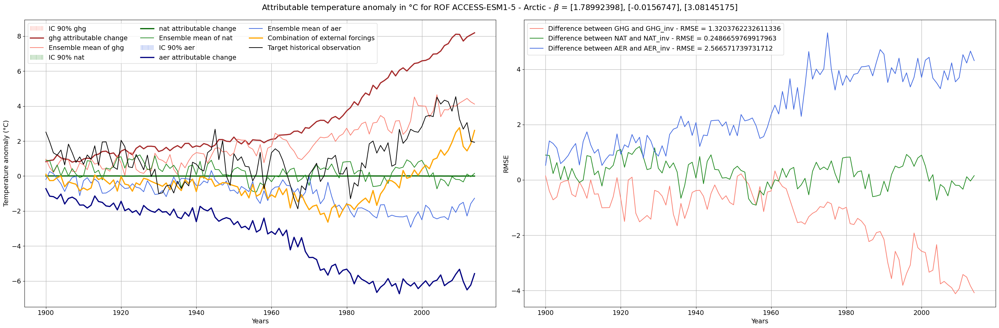

obs shape : (115,)
Mean_orig shape : (4, 115)
mean_tot shape : (115,)
torch.Size([115, 3])
torch.Size([115, 3])
torch.Size([115, 2])
torch.Size([115, 8])
torch.Size([115, 30])
torch.Size([115, 3])
torch.Size([115, 10])
torch.Size([115, 4])
torch.Size([115, 8])
torch.Size([115, 10])
torch.Size([115, 5])
torch.Size([115, 3])
count shape : (4,)
noise shape : (552, 115)
result Beta : [[1.22316818]
 [0.56532811]
 [1.17010295]]
 Ecart-type 0: nan
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/ghg_BCC-CSM2-MR.npy
mean_mod shape : (115,)


/net/pallas/usr/neuro/com/habbar/projet/data_nc/detatt_mk.py:380: RuntimeWarning: divide by zero encountered in divide
  b_m1 = a / np.dot(np.ones((np.size(pts[:,0]),1)),np.sqrt(dlam2[:-1]).T)
/net/pallas/usr/neuro/com/habbar/projet/data_nc/detatt_mk.py:417: UserWarning: Apparently the second entry here should be larger...
  warnings.warn('Apparently the second entry here should be larger...')


 Ecart-type 1: nan
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/nat_BCC-CSM2-MR.npy
mean_mod shape : (115,)
 Ecart-type 2: nan
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/aer_BCC-CSM2-MR.npy
mean_mod shape : (115,)
mean_mod: [ 0.44376759 -0.01001403  0.48663362  0.71156882  0.89354653  0.74641863
  0.94677754  0.3209515   0.40728973  0.75827721  0.4572192   0.53819566
  0.39044325  0.44347498  0.52743046  0.60126621  0.77320435  0.79605487
  1.24179993  0.28898653  1.15242491  1.25103758  0.5246791  -0.05867858
  0.59185912  0.47993263  0.91399866  1.33689593  0.82751274  0.73790205
  0.85406222  0.71535115  0.6812942  -0.05283786  0.90828354  0.81878907
  0.44575855  1.15901121  0.9056352   1.23988363  1.51781147  1.07704526
  1.03631744  1.18242662  1.04598866  1.54053868  1.27178094  0.76551332
  0.92470111  0.53408146  0.813872    0.73989212  0.70098354  1.2900962
  1.60349579  1.43565048  1.69766234  1.43526975  1.85010365  1.35399849
  1.15725

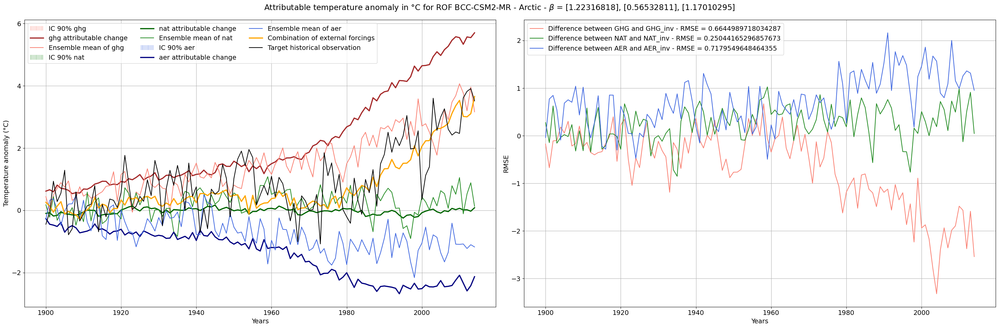

obs shape : (115,)
Mean_orig shape : (4, 115)
mean_tot shape : (115,)
torch.Size([115, 3])
torch.Size([115, 3])
torch.Size([115, 2])
torch.Size([115, 8])
torch.Size([115, 30])
torch.Size([115, 3])
torch.Size([115, 10])
torch.Size([115, 4])
torch.Size([115, 8])
torch.Size([115, 10])
torch.Size([115, 5])
torch.Size([115, 3])
count shape : (4,)
noise shape : (545, 115)
result Beta : [[ 1.42959948]
 [-2.92422658]
 [ 1.23197058]]
 Ecart-type 0: 0.5720220349044488
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/ghg_CESM2.npy
mean_mod shape : (115,)
 Ecart-type 1: 1.6037384327650808
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/nat_CESM2.npy
mean_mod shape : (115,)
 Ecart-type 2: 1.1638627840677023
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/aer_CESM2.npy
mean_mod shape : (115,)
mean_mod: [ 1.08472493  1.35131421  0.81606363  1.05153021  0.34433536  0.12090445
  0.32024074  0.37922011  0.22748279 -0.17186092 -0.02284203  0.49506667
  0.332233

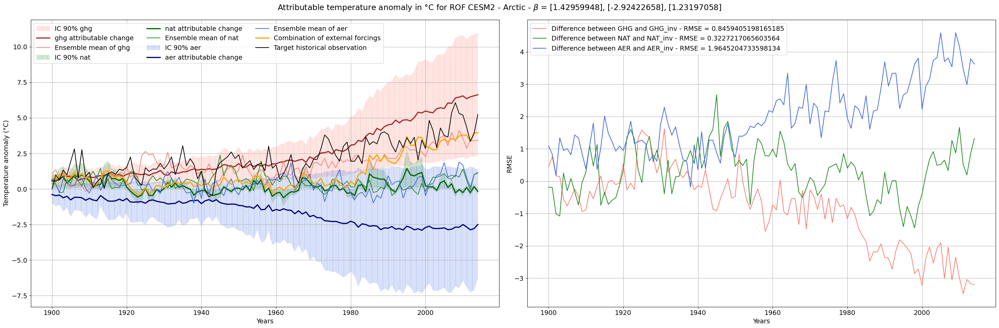

obs shape : (115,)
Mean_orig shape : (4, 115)
mean_tot shape : (115,)
torch.Size([115, 3])
torch.Size([115, 3])
torch.Size([115, 2])
torch.Size([115, 8])
torch.Size([115, 30])
torch.Size([115, 3])
torch.Size([115, 10])
torch.Size([115, 4])
torch.Size([115, 8])
torch.Size([115, 10])
torch.Size([115, 5])
torch.Size([115, 3])
count shape : (4,)
noise shape : (512, 115)
result Beta : [[-2.70843955]
 [16.75726218]
 [-7.22208695]]
 Ecart-type 0: 6.126132590718798
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/ghg_CNRM-CM6-1.npy
mean_mod shape : (115,)
 Ecart-type 1: 21.385967184160915
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/nat_CNRM-CM6-1.npy
mean_mod shape : (115,)
 Ecart-type 2: 12.063321564652183
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/aer_CNRM-CM6-1.npy
mean_mod shape : (115,)
mean_mod: [ 1.08675755e+00  8.07022053e-01  1.24554823e+00  1.37166256e+00
  9.37966335e-01  1.49875651e+00  1.02851923e+00  7.67411414e-01
  7.72308260

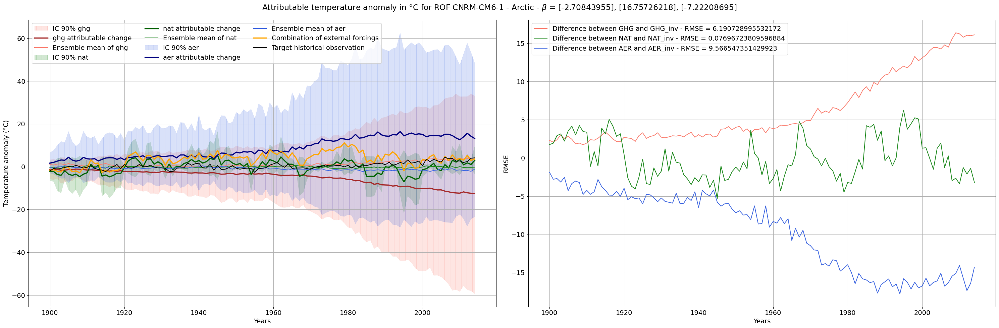

obs shape : (115,)
Mean_orig shape : (4, 115)
mean_tot shape : (115,)
torch.Size([115, 3])
torch.Size([115, 3])
torch.Size([115, 2])
torch.Size([115, 8])
torch.Size([115, 30])
torch.Size([115, 3])
torch.Size([115, 10])
torch.Size([115, 4])
torch.Size([115, 8])
torch.Size([115, 10])
torch.Size([115, 5])
torch.Size([115, 3])
count shape : (4,)
noise shape : (369, 115)
result Beta : [[  5.56395303]
 [-13.00113412]
 [ 12.0605342 ]]
 Ecart-type 0: 0.9040556729573569
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/ghg_CanESM5.npy
mean_mod shape : (115,)
 Ecart-type 1: 5.117618602372108
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/nat_CanESM5.npy
mean_mod shape : (115,)
 Ecart-type 2: 0.028250724398223917
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/aer_CanESM5.npy
mean_mod shape : (115,)
mean_mod: [0.14591502 0.25195886 0.10527369 0.35155814 0.17469714 0.36296177
 0.19929262 0.25930958 0.4133353  0.46101833 0.44657672 0.77716727
 0.75594165 

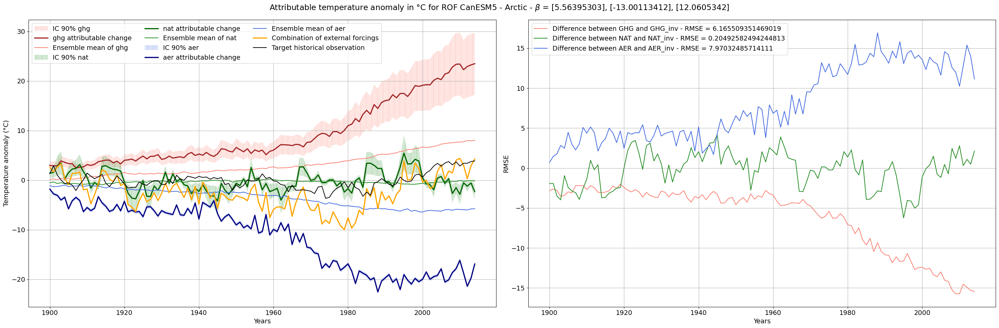

obs shape : (115,)
Mean_orig shape : (4, 115)
mean_tot shape : (115,)
torch.Size([115, 3])
torch.Size([115, 3])
torch.Size([115, 2])
torch.Size([115, 8])
torch.Size([115, 30])
torch.Size([115, 3])
torch.Size([115, 10])
torch.Size([115, 4])
torch.Size([115, 8])
torch.Size([115, 10])
torch.Size([115, 5])
torch.Size([115, 3])
count shape : (4,)
noise shape : (549, 115)
result Beta : [[0.78279293]
 [4.27652972]
 [0.53091984]]
 Ecart-type 0: 2.462828204867527
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/ghg_FGOALS-g3.npy
mean_mod shape : (115,)
 Ecart-type 1: 10.58702003413546
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/nat_FGOALS-g3.npy
mean_mod shape : (115,)
 Ecart-type 2: 4.728675669044409
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/aer_FGOALS-g3.npy
mean_mod shape : (115,)
mean_mod: [-0.1953727  -0.03620911  0.03483664  0.86000134  0.15518856 -0.07435314
 -0.02431322  0.10294582  0.57692856  0.69724725  0.88886186 -0.21607012
  0.

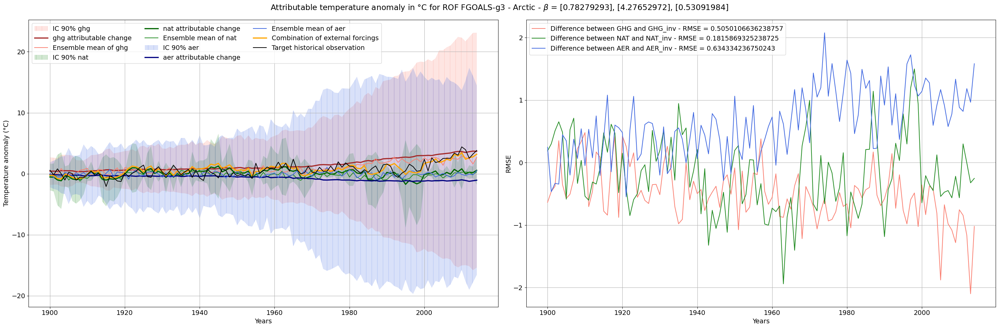

obs shape : (115,)
Mean_orig shape : (4, 115)
mean_tot shape : (115,)
torch.Size([115, 3])
torch.Size([115, 3])
torch.Size([115, 2])
torch.Size([115, 8])
torch.Size([115, 30])
torch.Size([115, 3])
torch.Size([115, 10])
torch.Size([115, 4])
torch.Size([115, 8])
torch.Size([115, 10])
torch.Size([115, 5])
torch.Size([115, 3])
count shape : (4,)
noise shape : (496, 115)
result Beta : [[ 3.34591829]
 [-5.68123455]
 [ 5.72017203]]
 Ecart-type 0: 1.2241809570306763
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/ghg_GISS-E2-1-G.npy
mean_mod shape : (115,)
 Ecart-type 1: 2.85223370776665
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/nat_GISS-E2-1-G.npy
mean_mod shape : (115,)
 Ecart-type 2: 2.546321812572345
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/aer_GISS-E2-1-G.npy
mean_mod shape : (115,)
mean_mod: [-0.27616582  0.09500888  0.01538719 -0.26726544  0.39000385  0.0481961
  0.01014286  0.27289414 -0.14091203 -0.41592247 -0.04237067 -0.05019

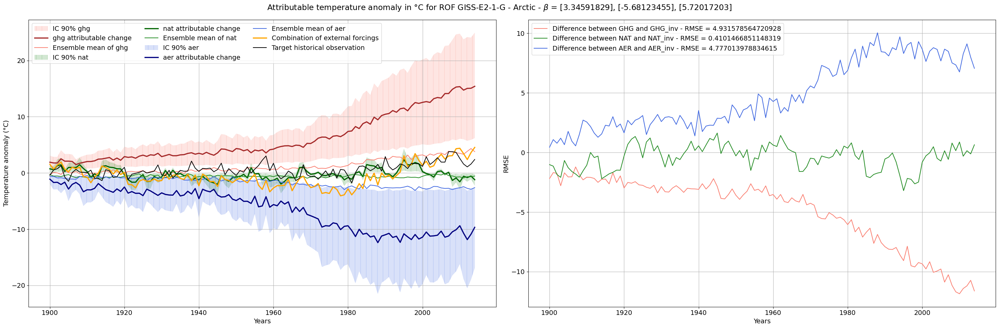

obs shape : (115,)
Mean_orig shape : (4, 115)
mean_tot shape : (115,)
torch.Size([115, 3])
torch.Size([115, 3])
torch.Size([115, 2])
torch.Size([115, 8])
torch.Size([115, 30])
torch.Size([115, 3])
torch.Size([115, 10])
torch.Size([115, 4])
torch.Size([115, 8])
torch.Size([115, 10])
torch.Size([115, 5])
torch.Size([115, 3])
count shape : (4,)
noise shape : (547, 115)
result Beta : [[-0.55056749]
 [ 5.34834889]
 [-2.7071375 ]]
 Ecart-type 0: 0.6153612031105827
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/ghg_HadGEM3-GC31-LL.npy
mean_mod shape : (115,)
 Ecart-type 1: 1.5632447509053706
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/nat_HadGEM3-GC31-LL.npy
mean_mod shape : (115,)
 Ecart-type 2: 1.2790362135474254
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/aer_HadGEM3-GC31-LL.npy
mean_mod shape : (115,)
mean_mod: [0.03513867 0.39286127 0.791516   0.76153403 0.49131755 0.8639628
 1.01971042 0.97514837 0.64134285 1.11249582 0.96241998 1.23

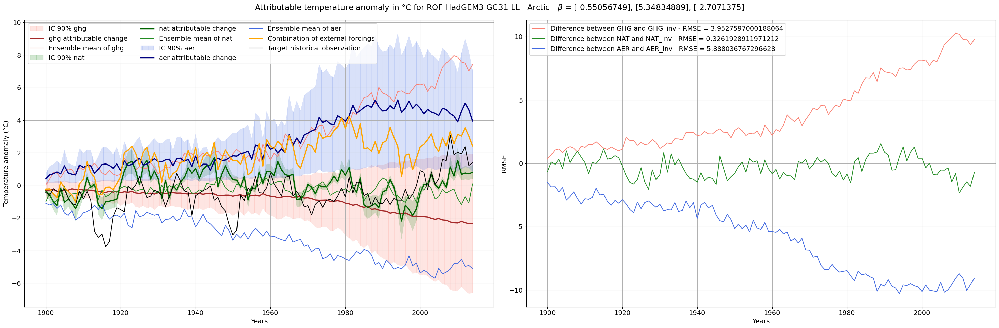

obs shape : (115,)
Mean_orig shape : (4, 115)
mean_tot shape : (115,)
torch.Size([115, 3])
torch.Size([115, 3])
torch.Size([115, 2])
torch.Size([115, 8])
torch.Size([115, 30])
torch.Size([115, 3])
torch.Size([115, 10])
torch.Size([115, 4])
torch.Size([115, 8])
torch.Size([115, 10])
torch.Size([115, 5])
torch.Size([115, 3])
count shape : (4,)
noise shape : (509, 115)
result Beta : [[-1.19931293]
 [ 7.90319284]
 [-4.24282498]]
 Ecart-type 0: 1.0942172462037671
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/ghg_IPSL-CM6A-LR.npy
mean_mod shape : (115,)
 Ecart-type 1: 3.287802640434922
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/nat_IPSL-CM6A-LR.npy
mean_mod shape : (115,)
 Ecart-type 2: 2.2857365947789603
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/aer_IPSL-CM6A-LR.npy
mean_mod shape : (115,)
mean_mod: [-3.00910706e-02  3.43558472e-03  1.97529212e-01  3.90681488e-01
  4.84248878e-01  6.27441041e-01  3.28838479e-01  3.71420946e-01
  3.61

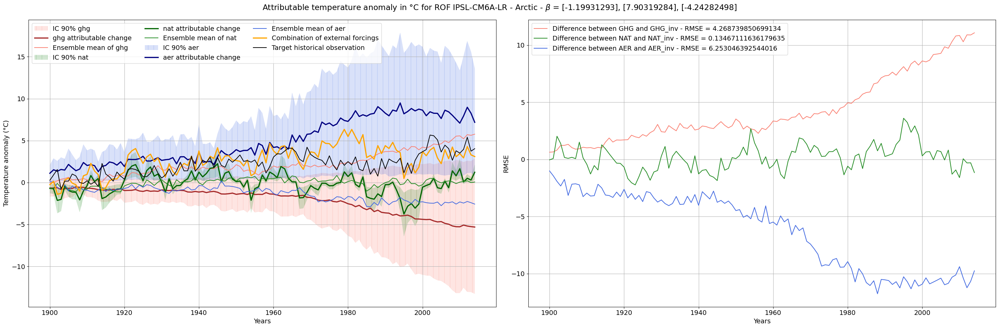

obs shape : (115,)
Mean_orig shape : (4, 115)
mean_tot shape : (115,)
torch.Size([115, 3])
torch.Size([115, 3])
torch.Size([115, 2])
torch.Size([115, 8])
torch.Size([115, 30])
torch.Size([115, 3])
torch.Size([115, 10])
torch.Size([115, 4])
torch.Size([115, 8])
torch.Size([115, 10])
torch.Size([115, 5])
torch.Size([115, 3])
count shape : (4,)
noise shape : (451, 115)
result Beta : [[ 1.50536529]
 [-0.79038766]
 [ 1.53462459]]
 Ecart-type 0: 0.7221744578981871
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/ghg_MIROC6.npy
mean_mod shape : (115,)
 Ecart-type 1: 1.5665899036362825
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/nat_MIROC6.npy
mean_mod shape : (115,)
 Ecart-type 2: 1.4592475438027328
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/aer_MIROC6.npy
mean_mod shape : (115,)
mean_mod: [1.33260575 1.29839099 0.84835494 1.25850621 1.54390177 1.14391778
 1.14490849 1.19447032 1.55598647 1.26485517 1.1676199  1.13179635
 0.9180466  0.90763

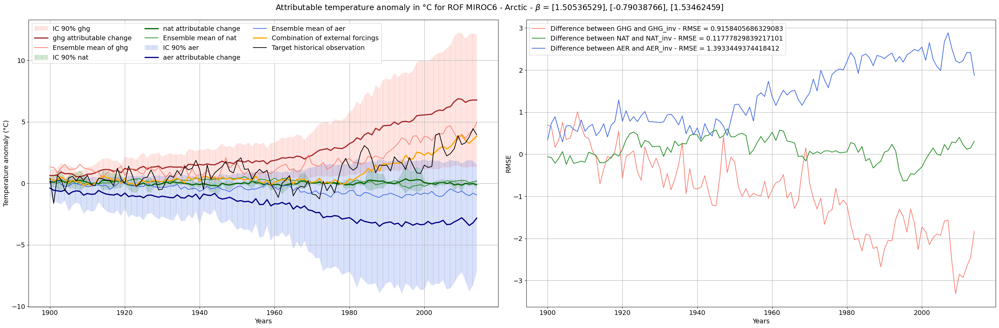

obs shape : (115,)
Mean_orig shape : (4, 115)
mean_tot shape : (115,)
torch.Size([115, 3])
torch.Size([115, 3])
torch.Size([115, 2])
torch.Size([115, 8])
torch.Size([115, 30])
torch.Size([115, 3])
torch.Size([115, 10])
torch.Size([115, 4])
torch.Size([115, 8])
torch.Size([115, 10])
torch.Size([115, 5])
torch.Size([115, 3])
count shape : (4,)
noise shape : (538, 115)
result Beta : [[ 10.34136047]
 [-21.43869214]
 [ 19.46766461]]
 Ecart-type 0: 30.951514726016452
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/ghg_MRI-ESM2-0.npy
mean_mod shape : (115,)
 Ecart-type 1: 73.32776662018348
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/nat_MRI-ESM2-0.npy
mean_mod shape : (115,)
 Ecart-type 2: 61.92416988568884
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/aer_MRI-ESM2-0.npy
mean_mod shape : (115,)
mean_mod: [ 0.52648806  0.71696959  0.49054258  0.64095887  0.61586133  0.64990675
  0.44895655  0.34845131  0.18625685 -0.11743068  0.16239938  0.517

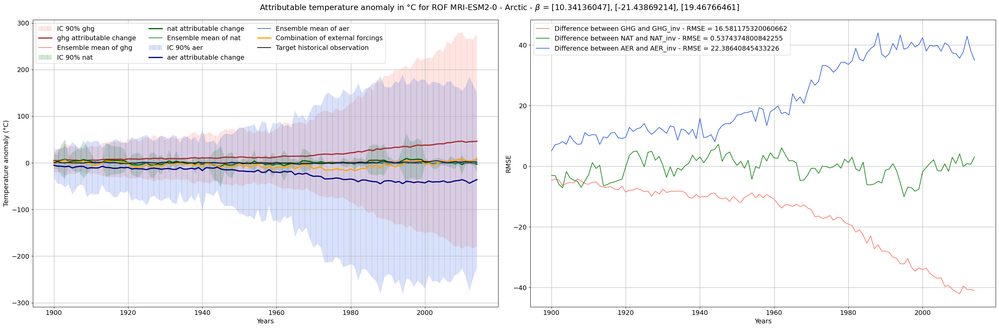

obs shape : (115,)
Mean_orig shape : (4, 115)
mean_tot shape : (115,)
torch.Size([115, 3])
torch.Size([115, 3])
torch.Size([115, 2])
torch.Size([115, 8])
torch.Size([115, 30])
torch.Size([115, 3])
torch.Size([115, 10])
torch.Size([115, 4])
torch.Size([115, 8])
torch.Size([115, 10])
torch.Size([115, 5])
torch.Size([115, 3])
count shape : (4,)
noise shape : (552, 115)
result Beta : [[ 0.17399049]
 [ 2.62198699]
 [-1.0076648 ]]
 Ecart-type 0: 0.5925116604317654
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/ghg_NorESM2-LM.npy
mean_mod shape : (115,)
 Ecart-type 1: 1.5709088605342176
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/nat_NorESM2-LM.npy
mean_mod shape : (115,)
 Ecart-type 2: 1.2844794221391156
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/aer_NorESM2-LM.npy
mean_mod shape : (115,)
mean_mod: [ 0.88633146  0.59114488  0.61185613  0.29524598  0.32245645  0.02829229
  0.38614689 -0.11519622  0.28923985  0.53011255  1.21643389  0.5150

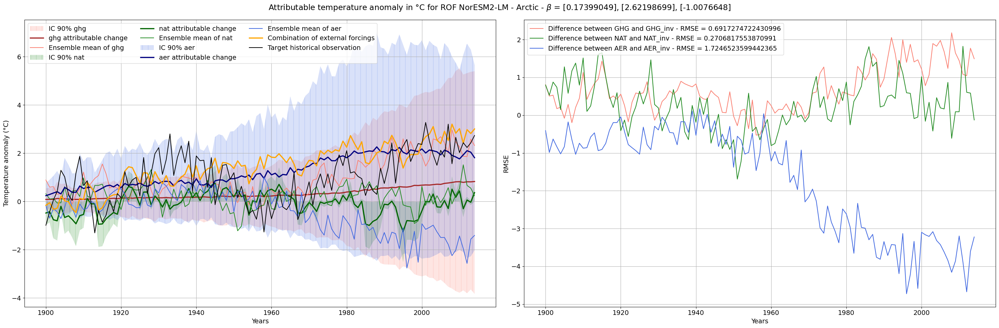

In [10]:
#fichier refaisant la procédure de Gilett avec nos données pour comparaison

#import extraction_data as extr
import numpy as np
import detatt_mk as da
import torch
import matplotlib.pyplot as plt
from scipy import stats
import os
plt.rcParams.update({'font.size': 14})

def mkdir_p(mypath):
    '''Creates a directory. equivalent to using mkdir -p on the command line'''
    from errno import EEXIST
    from os import makedirs, path

    try:
        makedirs(mypath)
    except OSError as exc:  # Python >2.5
        if exc.errno == EEXIST and path.isdir(mypath):
            pass
        else:
            raise

# Liste des modèles
liste_models = ['ACCESS', 'BCC', 'CESM2', 'CNRM', 'CanESM5', 'FGOALS',
                'GISS', 'HadGEM3', 'IPSL', 'MIRO', 'ESM2', 'NorESM2']

models = ['ACCESS-ESM1-5', 'BCC-CSM2-MR', 'CESM2', 'CNRM-CM6-1', 'CanESM5', 'FGOALS-g3',
          'GISS-E2-1-G', 'HadGEM3-GC31-LL', 'IPSL-CM6A-LR', 'MIROC6', 'MRI-ESM2-0', 'NorESM2-LM']
#models = ['ACCESS-ESM1-5']
all_results = []
for model in models:
    obs = torch.load(f'figures/{Region}/rand_hist_{model}.pt').detach().numpy()[0:115] * 1.06
    print(f"obs shape : {obs.shape}")

    variab = np.array([0.1, 0.13, 0.15, 0.11, 0.17, 0.10, 0.11, 0.13, 0.1, 0.15, 0.13, 0.15])

    Mean_orig = np.load(f'figures/{Region}/concatenated_forc_{model}.npy')
    #print(f"Mean_orig[3] : {Mean_orig[3]}")
    print(f"Mean_orig shape : {Mean_orig.shape}")
    mean_tot = np.mean(np.load(f'figures/{Region}/combined_data.npy')[:, 1], axis=0)
    print(f"mean_tot shape : {mean_tot.shape}")
    aer = torch.load(f'figures/{Region}/aer.pt')
    #print(f"aer : {aer}")

    for tensor in aer:
        print(tensor.shape)

    mean = np.copy(Mean_orig)

    count = np.load(f"figures/{Region}/count_{model}.npy")
    print(f"count shape : {count.shape}")
    #print(f"count : {count}")
    noise = np.load(f"figures/{Region}/noise_{model}.npy")
    print(f"noise shape : {noise.shape}")

    mean = np.transpose(mean)
    anom_index = noise.shape[0]
    noise = np.transpose(noise)

    (xr, yr, cn1, cn2) = da.reduce_dim(mean, obs[:, None], noise[:, list(range(1, anom_index, 2))],
                                        noise[:, list(range(0, anom_index, 2))])
    result = da.tls(xr[:, 0:3], yr, cn1, ne=count[0:3], cn2=cn2, rof_flag=1, RCT_flag=0)
    name_exp = 'ROF/' + Region + '/' + model + '/'
    path = '/usr/home/habbar/Bureau/data_nc/'
    path1 = '/usr/home/habbar/Bureau/reunion_rof/'
    mkdir_p(path + name_exp)
    print(f"result Beta : {result['beta']}")
    #print(f"result Beta shape : {result['beta'].shape}")

    mean_variab = np.mean(variab)
    sum_combined = np.zeros((115))
    plt.figure(figsize=(30, 10))
    mean_mod = np.zeros((3, 115))
    for forc in range(3):
        ecart = abs(result['betaCI'][forc, 1] - result['betaCI'][forc, 0]) / 2
        if abs(ecart) < 1e-8:  # Replace 1e-8 with an appropriate small value threshold
            ecart = 1e-8  # Set a small positive value to avoid division by zero
        else:
            ecart = abs(ecart) / 1.64

        # If ecart is still very close to zero, set a small positive value
        if ecart < 1e-8:
            ecart = 1e-8

        print(f" Ecart-type {forc}: {ecart}")
        #print(f"result Beta CI: {result['betaCI']}")
        x_inf = np.zeros((115))
        x_sup = np.zeros((115))
        nn = np.arange(115)
        #plt.subplot(1, 2, 1)
        # Load mean_mod for the current forcing
        mean_mod[forc] = np.load(f"/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/{Region}/{'ghg' if forc == 0 else 'nat' if forc == 1 else 'aer'}_{model}.npy")
        print(f"/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/{Region}/{'ghg' if forc == 0 else 'nat' if forc == 1 else 'aer'}_{model}.npy")
        print(f"mean_mod shape : {mean_mod[forc].shape}")
        for i in nn:
            Xn = np.random.normal(loc=Mean_orig[forc][i], scale=mean_variab / np.sqrt(count[forc]), size=10000)
            betan = np.random.normal(loc=result['beta'][forc], scale=ecart, size=10000)
            #print(f"Forc={forc}, i={i}, result['beta'][forc]: {result['beta'][forc]}, ecart: {ecart}")
            mult = Xn * betan
            x_inf[i] = np.percentile(mult, 5)
            x_sup[i] = np.percentile(mult, 95)
        
        f = ['ghg', 'nat', 'aer'][forc]
        color = ['salmon', 'forestgreen', 'royalblue'][forc]
        # les fill_between avec des traits verticaux pour les intervalles de confiance
        plt.subplot(1, 2, 1)
        plt.fill_between(nn, x_inf, x_sup, alpha=0.2, label=f'IC 90% {f}', color=color, hatch='|', edgecolor=color, linewidth=0.2)
        np.save(path + name_exp + str(forc) + '_result_mean', Mean_orig[forc] * result['beta'][forc])
        np.save(path + name_exp + str(forc) + '_result_min', x_inf)
        np.save(path + name_exp + str(forc) + '_result_max', x_sup)
        color_inv = ['brown', 'darkgreen', 'navy'][forc]
        plt.plot(nn, Mean_orig[forc] * result['beta'][forc], label=f'{f} attributable change', color=color_inv, linewidth=2.5)
        # Plot the mean_mod for the current forcing
        plt.plot(nn, mean_mod[forc], label=f'Ensemble mean of {f}', color=color)
        #plt.legend(loc='upper left', ncol=3)
        plt.xlabel('Years')
        plt.ylabel('Temperature anomaly (°C)')
        # changer la numérotation des axes de 1900 à 2014
        plt.xticks(np.arange(0, 115, 20), np.arange(1900, 2015, 20))
        plt.savefig(path + name_exp + str(forc) + '_result.png')

        sum_product = np.sum(result['beta'][forc] * Mean_orig[forc])

        #print(f"Somme des produits pour le forçage {forc}: {sum_product}")

        # Ajouter la courbe calculée à la somme globale
        sum_combined += Mean_orig[forc] * result['beta'][forc]
            
    #plt.title(f"ROF pour {model}")
    plt.grid()
    # rajouter un troisième subplot qui contient trois courbes pour les RMSE entre Ensemble mean of (ghg, nat et aer) et (ghg, nat et aer) attributable change calclcul des rmse en fonction des années rmse pour chaque année sans moyenne
    ghg_rmse = mean_mod[0] - Mean_orig[0] * result['beta'][0]
    nat_rmse = mean_mod[1] - Mean_orig[1] * result['beta'][1]
    aer_rmse = mean_mod[2] - Mean_orig[2] * result['beta'][2]
    print(f"mean_mod: {mean_mod[0]}")
    print(f"Mean_orig[0] * result['beta'][0]: {Mean_orig[0] * result['beta'][0]}")
    ghg_rmse_mean = np.sqrt(np.mean(mean_mod[0] - Mean_orig[0] * result['beta'][0])**2)
    nat_rmse_mean = np.sqrt(np.mean(mean_mod[1] - Mean_orig[1] * result['beta'][1])**2)
    aer_rmse_mean = np.sqrt(np.mean(mean_mod[2] - Mean_orig[2] * result['beta'][2])**2)
    
    # titre avec beta ecris en latex
    #plt.suptitle(f"ROF pour {model} avec $\\beta$ = {result['beta'][0]}, {result['beta'][1]}, {result['beta'][2]} - {Region}")
    plt.suptitle(f"Attributable temperature anomaly in °C for ROF {model} - {Region} - $\\beta$ = {result['beta'][0]}, {result['beta'][1]}, {result['beta'][2]}")
    plt.subplots_adjust(top=0.9)
    #plt.subplot(2, 2, 2)

    # Plot the data
    #plt.figure(figsize=(10, 5))
    plt.plot(nn, sum_combined, label='Combination of external forcings', color='orange', linewidth=2.5)
    plt.plot(nn, obs, label='Target historical observation', color='black')
    #plt.xlabel('Years')
    plt.legend(loc='upper left', ncol=3)
    # changer la numérotation des axes de 1900 à 2014
    #plt.xticks(np.arange(0, 115, 20), np.arange(1900, 2015, 20))
    plt.subplots_adjust(wspace=0.1)
    #plt.suptitle(f"ROF pour {model}")
    #plt.title(f"ROF pour {model}")

    # Troisième subplot en courbe pour les rmse des 3 forçages
    plt.subplot(1, 2, 2)
    plt.grid()
    # mettre dans les labels les rmse calculer
    plt.plot(nn, np.ones((115)) * ghg_rmse, label=f"Difference between GHG and GHG_inv - RMSE = {ghg_rmse_mean}", color='salmon')
    plt.plot(nn, np.ones((115)) * nat_rmse, label=f"Difference between NAT and NAT_inv - RMSE = {nat_rmse_mean}", color='forestgreen')
    plt.plot(nn, np.ones((115)) * aer_rmse, label=f"Difference between AER and AER_inv - RMSE = {aer_rmse_mean}", color='royalblue')
    plt.xlabel('Years')
    plt.legend(loc='upper left', ncol=1)
    plt.ylabel('RMSE')
    plt.subplots_adjust(wspace=0.08)
    # changer la numérotation des axes de 1900 à 2014
    plt.xticks(np.arange(0, 115, 20), np.arange(1900, 2015, 20))
    plt.subplots_adjust(wspace=0.04)
    plt.tight_layout()
    plt.show()
    
    '''
    # Quatrième subplot en courbe pour les rmse moyens des 3 forçages en histogramme
    plt.subplot(2, 2, 3)
    plt.grid()
    plt.bar(['GHG', 'NAT', 'AER'], [ghg_rmse_mean, nat_rmse_mean, aer_rmse_mean], color=['salmon', 'forestgreen', 'royalblue'])
    plt.xlabel('Forcing')
    plt.subplots_adjust(wspace=0.08)
    plt.tight_layout()
    plt.savefig(path + name_exp + '_result.png')
    plt.show()
    '''

obs shape : (115,)
Mean_orig shape : (4, 115)
mean_tot shape : (115,)
torch.Size([115, 3])
torch.Size([115, 3])
torch.Size([115, 2])
torch.Size([115, 8])
torch.Size([115, 30])
torch.Size([115, 3])
torch.Size([115, 10])
torch.Size([115, 4])
torch.Size([115, 8])
torch.Size([115, 10])
torch.Size([115, 5])
torch.Size([115, 3])
count shape : (4,)
noise shape : (540, 115)
result Beta : [[ 1.78992398]
 [-0.0156747 ]
 [ 3.08145175]]
 Ecart-type 0: nan
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/ghg_ACCESS-ESM1-5.npy
mean_mod shape : (115,)


/tmp/ipykernel_32340/555168291.py:178: MatplotlibDeprecationWarning: Passing the emit parameter of set_ylim() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  ax.set_ylim(-6.5, 8.5, 1)


 Ecart-type 1: nan
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/nat_ACCESS-ESM1-5.npy
mean_mod shape : (115,)


 Ecart-type 2: nan
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/aer_ACCESS-ESM1-5.npy
mean_mod shape : (115,)
mean_mod: [0.96543149 0.48733951 0.19798798 0.59241494 0.92538025 0.93305477
 0.92983596 0.27051004 0.25381301 0.74519577 0.64867162 0.35982502
 0.99008357 0.6812204  0.74922079 0.39583634 0.41927751 0.27790515
 0.71594384 1.15296591 0.74444788 0.02381025 1.3508977  1.31680442
 0.38027794 0.21174854 0.15341656 0.41321152 0.28456183 1.30089046
 0.97231043 0.89204939 0.73096283 1.22801666 0.38269105 0.08077541
 0.75897822 0.46918292 0.87783231 1.18763414 1.33792105 1.30354634
 1.2655225  0.72615173 1.16366975 1.58796776 1.61145363 1.38037668
 1.41845646 1.15316585 1.3299167  2.11108921 2.05738757 2.04878876
 1.65524271 1.53832609 1.14815744 1.80258051 0.76018254 1.59240017
 1.70666082 2.44758854 2.30070724 2.11165076 2.04429056 1.66445033
 1.41700654 1.02793085 0.94085745 1.16727321 1.40307011 1.71792856
 1.98163932 2.22324317 2.18665729 2.23223174 2.44514122 1.

/tmp/ipykernel_32340/555168291.py:227: MatplotlibDeprecationWarning: Passing the emit parameter of set_ylim() positionally is deprecated since Matplotlib 3.6; the parameter will become keyword-only two minor releases later.
  axe.set_ylim(-6., 6., 2)


obs shape : (115,)
Mean_orig shape : (4, 115)
mean_tot shape : (115,)
torch.Size([115, 3])
torch.Size([115, 3])
torch.Size([115, 2])
torch.Size([115, 8])
torch.Size([115, 30])
torch.Size([115, 3])
torch.Size([115, 10])
torch.Size([115, 4])
torch.Size([115, 8])
torch.Size([115, 10])
torch.Size([115, 5])
torch.Size([115, 3])
count shape : (4,)
noise shape : (552, 115)
result Beta : [[1.22316818]
 [0.56532811]
 [1.17010295]]
 Ecart-type 0: nan
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/ghg_BCC-CSM2-MR.npy
mean_mod shape : (115,)
 Ecart-type 1: nan
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/nat_BCC-CSM2-MR.npy
mean_mod shape : (115,)
 Ecart-type 2: nan
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/aer_BCC-CSM2-MR.npy
mean_mod shape : (115,)
mean_mod: [ 0.44376759 -0.01001403  0.48663362  0.71156882  0.89354653  0.74641863
  0.94677754  0.3209515   0.40728973  0.75827721  0.4572192   0.53819566
  0.39044325  0.44347498  0.52743046  0.

/tmp/ipykernel_32340/555168291.py:120: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(9.5, 7.), gridspec_kw={'hspace': hspace, 'wspace': wspace,


 Ecart-type 0: 31.01805555343689
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/ghg_MRI-ESM2-0.npy
mean_mod shape : (115,)
 Ecart-type 1: 73.25867907355385
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/nat_MRI-ESM2-0.npy
mean_mod shape : (115,)
 Ecart-type 2: 61.8939686654709
/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/Arctic/aer_MRI-ESM2-0.npy
mean_mod shape : (115,)
mean_mod: [ 0.52648806  0.71696959  0.49054258  0.64095887  0.61586133  0.64990675
  0.44895655  0.34845131  0.18625685 -0.11743068  0.16239938  0.51723941
  0.77250324  0.57778827  0.55493919  0.81079395  1.01088524  0.05866127
  0.31094343  0.35076335  0.21580761  0.50000304  0.66257925  0.509986
  0.92852081  0.93465508  0.49740137  0.1723556   0.97817186  0.94777741
  0.76432707  0.36801004  0.98672276  0.6832992   0.81164045  0.98930927
  0.69983261  0.51412129  0.58305001  0.66854292  0.5195196   0.48423361
  0.95218496  1.0880301   0.90957691  0.73234722  1.49383002  1.5

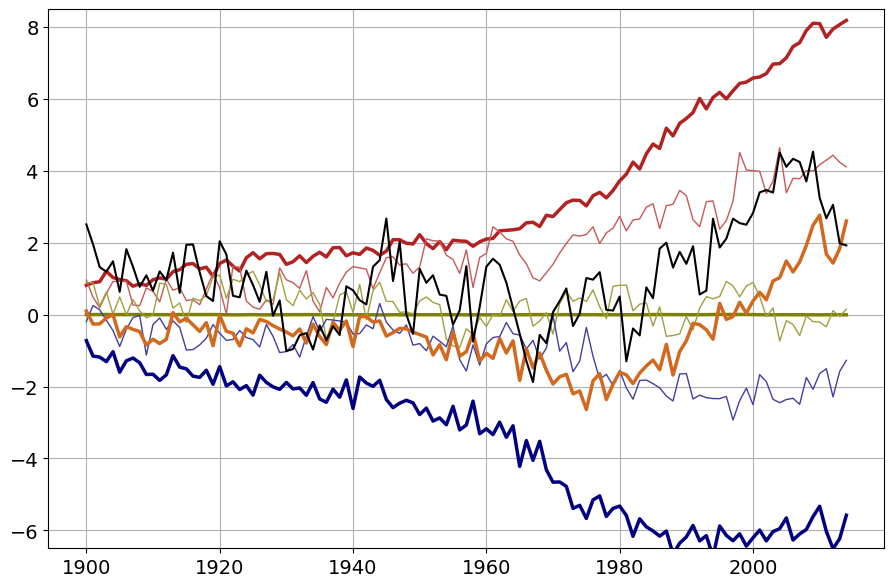

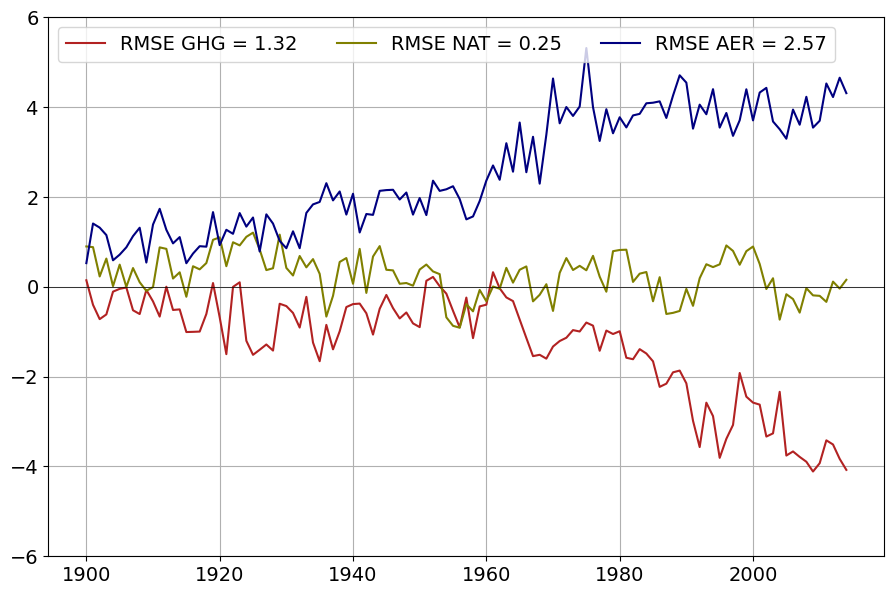

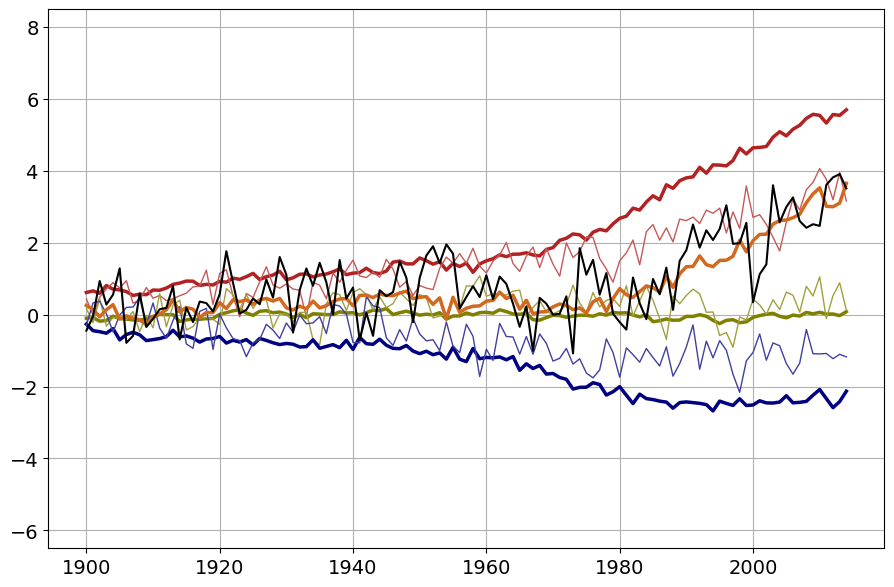

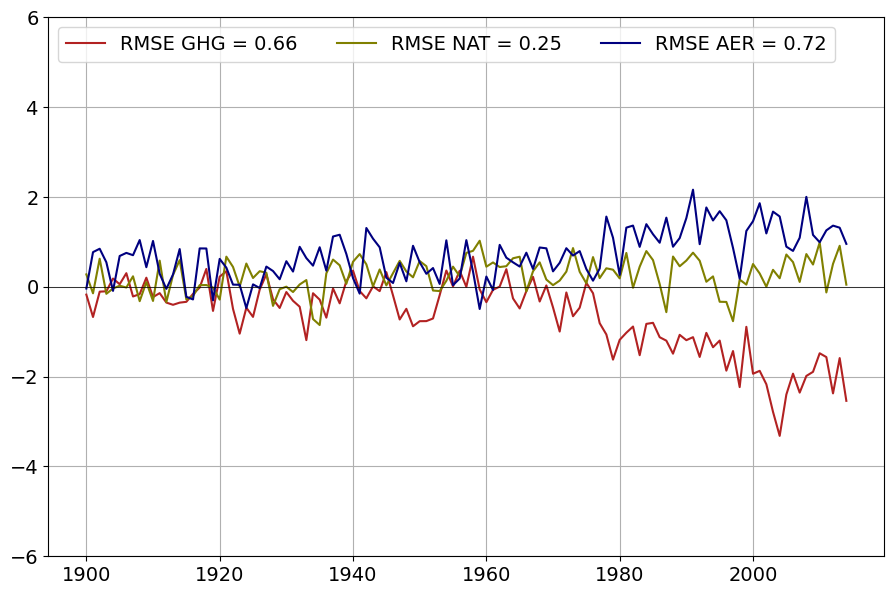

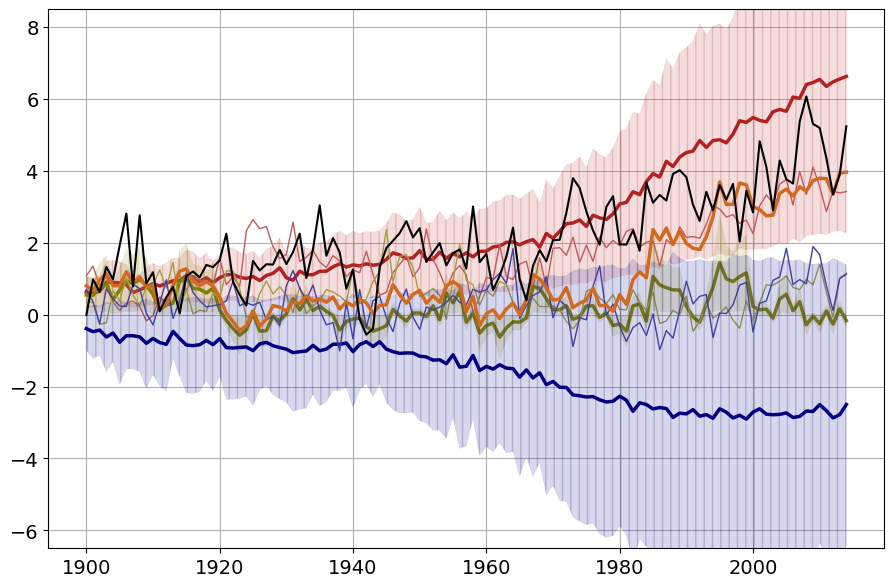

...

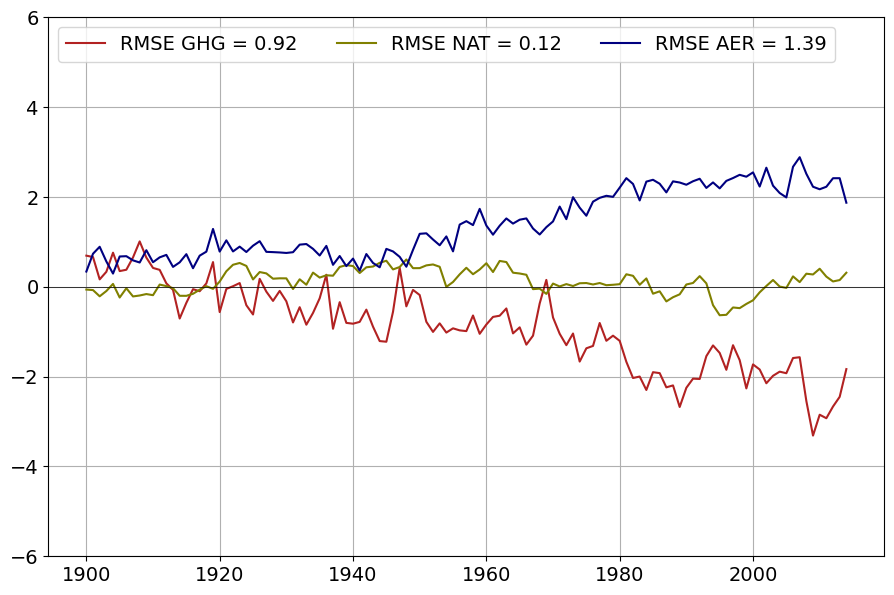

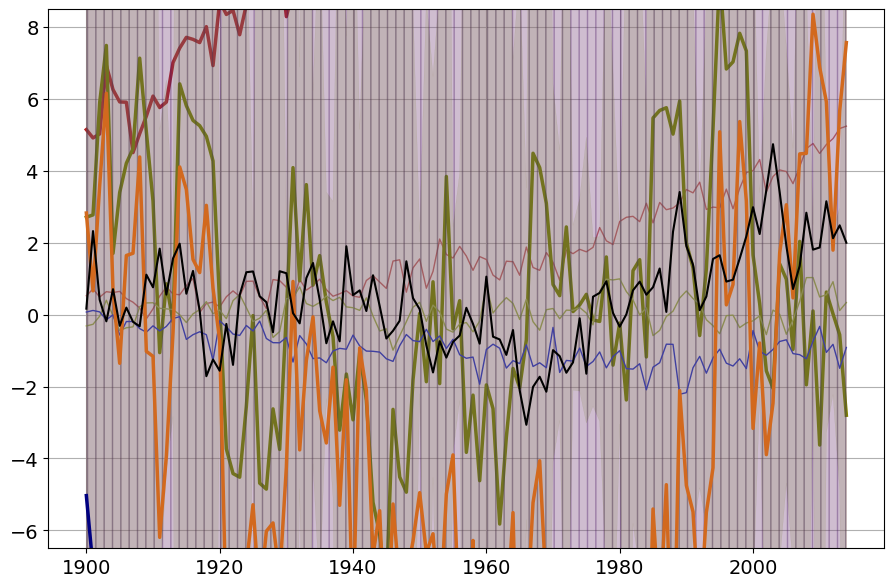

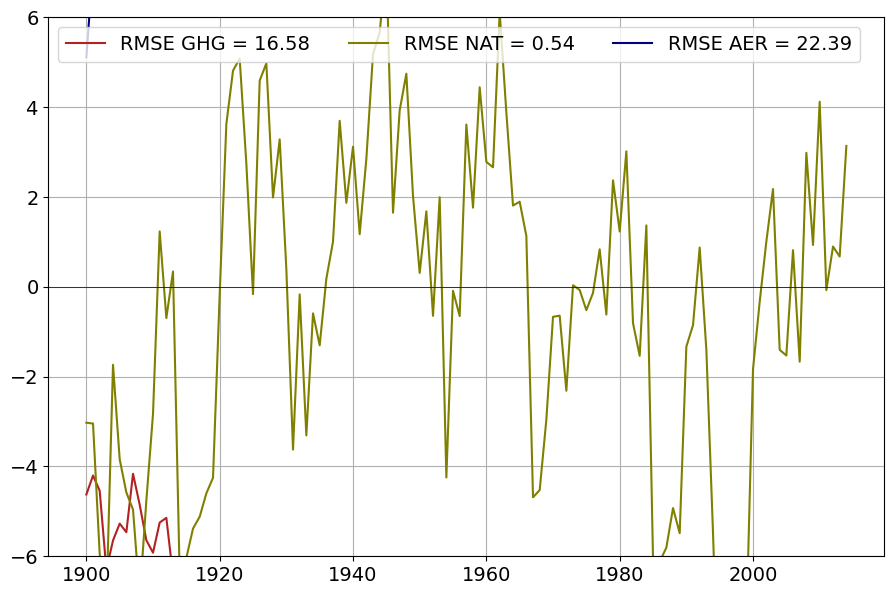

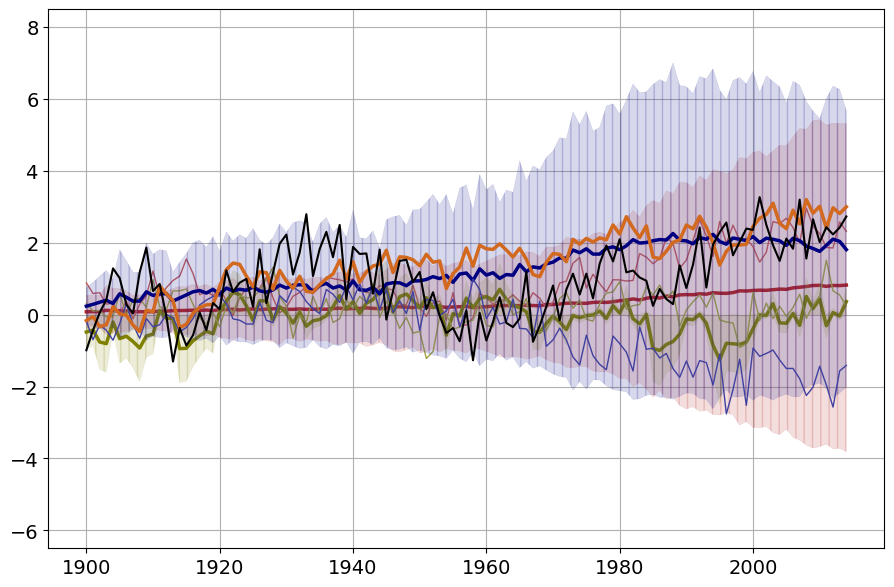

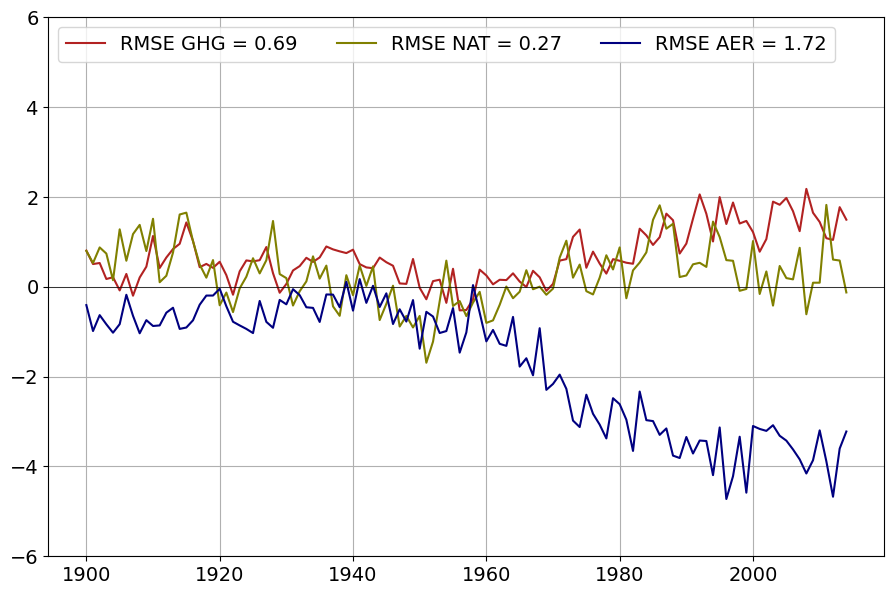

In [11]:
#fichier refaisant la procédure de Gilett avec nos données pour comparaison

#import extraction_data as extr
import numpy as np
import detatt_mk as da
import torch
import matplotlib.pyplot as plt
import generic_tools_pl as gt
from scipy import stats
import os
plt.rcParams.update({'font.size': 14})

def mkdir_p(mypath):
    '''Creates a directory. equivalent to using mkdir -p on the command line'''
    from errno import EEXIST
    from os import makedirs, path

    try:
        makedirs(mypath)
    except OSError as exc:  # Python >2.5
        if exc.errno == EEXIST and path.isdir(mypath):
            pass
        else:
            raise

# Liste des modèles
liste_models = ['ACCESS', 'BCC', 'CESM2', 'CNRM', 'CanESM5', 'FGOALS',
                'GISS', 'HadGEM3', 'IPSL', 'MIRO', 'ESM2', 'NorESM2']

models = ['ACCESS-ESM1-5', 'BCC-CSM2-MR', 'CESM2', 'CNRM-CM6-1', 'CanESM5', 'FGOALS-g3',
          'GISS-E2-1-G', 'HadGEM3-GC31-LL', 'IPSL-CM6A-LR', 'MIROC6', 'MRI-ESM2-0', 'NorESM2-LM']
#models = ['ACCESS-ESM1-5']
all_results = []

local_forcings_names = [ 'ghg',    'aer',     'nat',     'hist' ]
forcings = [ 'ghg',    'aer',     'nat',     'hist' ]

# Color palettes for source data ou predicted/inverted data (same as used by Constantin Bone)
colors_dic = gt.get_forcing_colors()

local_forcing_src_colors = colors_dic['standard']
local_forcing_src_color_names = colors_dic['standard_names']

local_forcing_darker_colors = colors_dic['darker']
local_forcing_darker_color_names = colors_dic['darker_names']

local_forcing_lighter_colors = colors_dic['lighter']
local_forcing_lighter_color_names = colors_dic['lighter_names']

local_forcing_colors = local_forcing_darker_colors
local_forcing_color_names = local_forcing_darker_color_names

local_forcing_inv_colors = local_forcing_src_colors
local_forcing_inv_color_names = local_forcing_src_color_names

local_forcing_light_colors = local_forcing_lighter_colors
local_forcing_light_color_names = local_forcing_lighter_color_names

forcing_color_dic       = {f:local_forcing_colors[local_forcings_names.index(f.lower())] for f in forcings}
forcing_color_names_dic = {f:local_forcing_color_names[local_forcings_names.index(f.lower())] for f in forcings}

forcing_inv_color_dic       = {f:local_forcing_inv_colors[local_forcings_names.index(f.lower())] for f in forcings}
forcing_inv_color_names_dic = {f:local_forcing_inv_color_names[local_forcings_names.index(f.lower())] for f in forcings}

forcing_light_color_dic       = {f:local_forcing_lighter_colors[local_forcings_names.index(f.lower())] for f in forcings}
forcing_light_color_names_dic = {f:local_forcing_lighter_color_names[local_forcings_names.index(f.lower())] for f in forcings}

forcing_names = ['ghg', 'nat', 'aer']
forcing_colors = [forcing_color_dic[f.lower()] for f in forcing_names]
forcing_src_colors = [gt.lighter_color(cs) for cs in forcing_colors]

hist_color = forcing_color_dic['hist']
hist_inv_color = forcing_inv_color_dic['hist']

for model in models:
    obs = torch.load(f'figures/{Region}/rand_hist_{model}.pt').detach().numpy()[0:115] * 1.06
    print(f"obs shape : {obs.shape}")

    variab = np.array([0.1, 0.13, 0.15, 0.11, 0.17, 0.10, 0.11, 0.13, 0.1, 0.15, 0.13, 0.15])

    Mean_orig = np.load(f'figures/{Region}/concatenated_forc_{model}.npy')
    #print(f"Mean_orig[3] : {Mean_orig[3]}")
    print(f"Mean_orig shape : {Mean_orig.shape}")
    mean_tot = np.mean(np.load(f'figures/{Region}/combined_data.npy')[:, 1], axis=0)
    print(f"mean_tot shape : {mean_tot.shape}")
    aer = torch.load(f'figures/{Region}/aer.pt')
    #print(f"aer : {aer}")

    for tensor in aer:
        print(tensor.shape)

    mean = np.copy(Mean_orig)

    count = np.load(f"figures/{Region}/count_{model}.npy")
    print(f"count shape : {count.shape}")
    #print(f"count : {count}")
    noise = np.load(f"figures/{Region}/noise_{model}.npy")
    print(f"noise shape : {noise.shape}")

    mean = np.transpose(mean)
    anom_index = noise.shape[0]
    noise = np.transpose(noise)

    (xr, yr, cn1, cn2) = da.reduce_dim(mean, obs[:, None], noise[:, list(range(1, anom_index, 2))],
                                        noise[:, list(range(0, anom_index, 2))])
    result = da.tls(xr[:, 0:3], yr, cn1, ne=count[0:3], cn2=cn2, rof_flag=1, RCT_flag=0)
    name_exp = 'ROF/' + Region + '/' + model + '/'
    path = '/usr/home/habbar/Bureau/data_nc/'
    path1 = '/usr/home/habbar/Bureau/reunion_rof/'
    mkdir_p(path + name_exp)
    print(f"result Beta : {result['beta']}")
    #print(f"result Beta shape : {result['beta'].shape}")

    mean_variab = np.mean(variab)
    sum_combined = np.zeros((115))
    bottom = 0.08; top = 0.85
    left   = 0.10; right  = 0.98
    wspace = 0.05; hspace = 0.12

    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(9.5, 7.), gridspec_kw={'hspace': hspace, 'wspace': wspace,
                                             'left': left, 'right': right,
                                             'top': top, 'bottom': bottom })
    
    figu, axe = plt.subplots(nrows=1, ncols=1, figsize=(9.5, 7.), gridspec_kw={'hspace': hspace, 'wspace': wspace,
                                             'left': left, 'right': right,
                                             'top': top, 'bottom': bottom })
    
    mean_mod = np.zeros((3, 115))
    for forc in range(3):
        ecart = abs(result['betaCI'][forc, 1] - result['betaCI'][forc, 0]) / 2
        if abs(ecart) < 1e-8:  # Replace 1e-8 with an appropriate small value threshold
            ecart = 1e-8  # Set a small positive value to avoid division by zero
        else:
            ecart = abs(ecart) / 1.64

        # If ecart is still very close to zero, set a small positive value
        if ecart < 1e-8:
            ecart = 1e-8

        print(f" Ecart-type {forc}: {ecart}")
        #print(f"result Beta CI: {result['betaCI']}")
        x_inf = np.zeros((115))
        x_sup = np.zeros((115))
        nn = np.arange(115)
        #plt.subplot(1, 2, 1)
        # Load mean_mod for the current forcing
        mean_mod[forc] = np.load(f"/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/{Region}/{'ghg' if forc == 0 else 'nat' if forc == 1 else 'aer'}_{model}.npy")
        print(f"/net/pallas/usr/neuro/com/habbar/projet/data_nc/figures/{Region}/{'ghg' if forc == 0 else 'nat' if forc == 1 else 'aer'}_{model}.npy")
        print(f"mean_mod shape : {mean_mod[forc].shape}")
        for i in nn:
            Xn = np.random.normal(loc=Mean_orig[forc][i], scale=mean_variab / np.sqrt(count[forc]), size=10000)
            betan = np.random.normal(loc=result['beta'][forc], scale=ecart, size=10000)
            #print(f"Forc={forc}, i={i}, result['beta'][forc]: {result['beta'][forc]}, ecart: {ecart}")
            mult = Xn * betan
            x_inf[i] = np.percentile(mult, 5)
            x_sup[i] = np.percentile(mult, 95)
        
        f = ['ghg', 'nat', 'aer'][forc]
        #color = ['salmon', 'forestgreen', 'royalblue'][forc]
        # les fill_between avec des traits verticaux pour les intervalles de confiance
        #plt.subplot(1, 1, 1)
        color_inv = forcing_colors[forc]
        color_src = forcing_src_colors[forc]
        ax.fill_between(nn, x_inf, x_sup, alpha=0.2, label=f'IC 90% {f}', fc=gt.lighter_color(color_inv), hatch='||', edgecolor=color_inv, linewidth=0.2, zorder=2)
        np.save(path + name_exp + str(forc) + '_result_mean', Mean_orig[forc] * result['beta'][forc])
        np.save(path + name_exp + str(forc) + '_result_min', x_inf)
        np.save(path + name_exp + str(forc) + '_result_max', x_sup)
        #color_inv = ['brown', 'darkgreen', 'navy'][forc]
        ax.plot(nn, Mean_orig[forc] * result['beta'][forc], label=f'{f} attributable change', color=color_inv, linewidth=2.5, ls='-')
        # Plot the mean_mod for the current forcing
        ax.plot(nn, mean_mod[forc], label=f'Ensemble mean of {f}', color=color_src, lw = 1, ls='-')
        #plt.legend(loc='upper left', ncol=3)
        #plt.xlabel('Years')
        #plt.ylabel('Temperature anomaly (°C)')
        # changer la numérotation des axes de 1900 à 2014
        ax.set_xticks(np.arange(0, 115, 20), np.arange(1900, 2015, 20))
        #ax.set_ylim(-3.5, 4.5, 1)
        ax.set_ylim(-6.5, 8.5, 1)
        fig.savefig(path + name_exp + str(forc) + '_result.png')

        sum_product = np.sum(result['beta'][forc] * Mean_orig[forc])

        #print(f"Somme des produits pour le forçage {forc}: {sum_product}")
        ax.grid()

        # Ajouter la courbe calculée à la somme globale
        sum_combined += Mean_orig[forc] * result['beta'][forc]
            
    #plt.title(f"ROF pour {model}")
    ax.grid()
    # rajouter un troisième subplot qui contient trois courbes pour les RMSE entre Ensemble mean of (ghg, nat et aer) et (ghg, nat et aer) attributable change calclcul des rmse en fonction des années rmse pour chaque année sans moyenne
    ghg_rmse = mean_mod[0] - Mean_orig[0] * result['beta'][0]
    nat_rmse = mean_mod[1] - Mean_orig[1] * result['beta'][1]
    aer_rmse = mean_mod[2] - Mean_orig[2] * result['beta'][2]
    print(f"mean_mod: {mean_mod[0]}")
    print(f"Mean_orig[0] * result['beta'][0]: {Mean_orig[0] * result['beta'][0]}")
    ghg_rmse_mean = np.sqrt(np.mean(mean_mod[0] - Mean_orig[0] * result['beta'][0])**2)
    nat_rmse_mean = np.sqrt(np.mean(mean_mod[1] - Mean_orig[1] * result['beta'][1])**2)
    aer_rmse_mean = np.sqrt(np.mean(mean_mod[2] - Mean_orig[2] * result['beta'][2])**2)
    
    # titre avec beta ecris en latex
    #plt.suptitle(f"ROF pour {model} avec $\\beta$ = {result['beta'][0]}, {result['beta'][1]}, {result['beta'][2]} - {Region}")
    #plt.suptitle(f"Attributable temperature anomaly in °C for ROF {model} - {Region} - $\\beta$ = {result['beta'][0]}, {result['beta'][1]}, {result['beta'][2]}")
    fig.subplots_adjust(top=0.9)
    #plt.subplot(2, 2, 2)

    # Plot the data
    #plt.figure(figsize=(10, 5))
    ax.plot(nn, sum_combined, label='Combination of external forcings', color=hist_inv_color, linewidth=2.5)
    ax.plot(nn, obs, label='Target historical observation', color=hist_color)
    #plt.xlabel('Years')
    #plt.legend(loc='upper left', ncol=3)
    # changer la numérotation des axes de 1900 à 2014
    #plt.xticks(np.arange(0, 115, 20), np.arange(1900, 2015, 20))
    #plt.suptitle(f"ROF pour {model}")
    #plt.title(f"ROF pour {model}")
    ax.grid()
    fig.savefig(path + name_exp + f'{model}_result.png')
    fig.show()
    
    # plotter les distantes entre les courbes 
    axe.plot(nn, ghg_rmse, label=f"RMSE GHG = {ghg_rmse_mean:.2f}", color=forcing_colors[0], linewidth=1.5)
    axe.plot(nn, nat_rmse, label=f"RMSE NAT = {nat_rmse_mean:.2f}", color=forcing_colors[1], linewidth=1.5)
    axe.plot(nn, aer_rmse, label=f"RMSE AER = {aer_rmse_mean:.2f}", color=forcing_colors[2], linewidth=1.5)
    axe.set_xticks(np.arange(0, 115, 20), np.arange(1900, 2015, 20))
    axe.set_ylim(-3., 3., 1)
    #axe.set_ylim(-6., 6., 2)
    xlim = axe.get_xlim()
    axe.axhline(0., color='k', lw=.5)
    axe.set_xlim(xlim)
    axe.grid()
    axe.legend(loc='upper left', ncol=3)
    figu.savefig(path + name_exp + f'{model}_rmse.png')
    figu.show()